## Getting Ready

**Before we start downloading the data set, we need the Kaggle API token. To get that**

    1) Login into your Kaggle account

    2) Get into your account settings page

    3) Click on Create a new API token
    
    4) This will prompt you to download the .json file into your system. Save the file, and we will use it in the next step.

## Data pre-processing: parse url, remove redundant columns, min-max scaling

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Config display
import sys
import warnings
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from skimpy import skim
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.discovery import all_displays
# from tune_sklearn import TuneGridSearchCV
# from sklearn.tree import export_graphviz

warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.float_format", lambda x: "%.3f" % x)
pd.set_option("display.width", 500)

# Config sys path
if ('../' not in sys.path):
    sys.path.append('../')
    
# Import library
from fraud import *
from sklearn.model_selection import train_test_split

# Set seed
seed = 4263

Skipping, found downloaded files in "../data/raw\malicious-urls-dataset" (use force=True to force download)


,url,type
count,651191,651191
unique,641119,4
top,http://style.org.hc360.com/css/detail/mysite/s...,benign
freq,180,428103


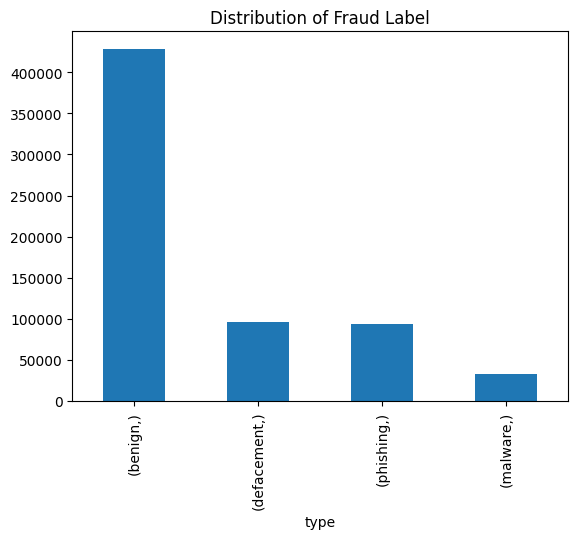

In [3]:
# Download and load dataset 
download_path = "../data/raw"
df = download_and_load_new(download_path)
df[['type']].value_counts().plot(kind="bar", title="Distribution of Fraud Label")
df.head(5)
df.describe()

In [4]:
# Take only labels of "benign" as "non-phishing", and "phishing". Filtering out irrelvant values such as "defacement" and "malware"
df = df.loc[(df['type'] == 'benign') | (df['type'] == 'phishing')]

# Parse URLs
df = process_new_url(df)

# Extracting 86 features such as qty_at_file from the parsed df
df = reformat_df(df)

,url,type,parsed_url,domain,directory,file,params,length_url,domain_length,directory_length,file_length,params_length,qty_at_url,qty_questionmark_url,qty_underline_url,qty_hyphen_url,qty_equal_url,qty_dot_url,qty_hashtag_url,qty_percent_url,qty_plus_url,qty_dollar_url,qty_exclamation_url,qty_asterisk_url,qty_comma_url,qty_slash_url,qty_space_url,qty_tilde_url,qty_and_url,qty_at_domain,qty_questionmark_domain,qty_underline_domain,qty_hyphen_domain,qty_equal_domain,qty_dot_domain,qty_hashtag_domain,qty_percent_domain,qty_plus_domain,qty_dollar_domain,qty_exclamation_domain,qty_asterisk_domain,qty_comma_domain,qty_slash_domain,qty_space_domain,qty_tilde_domain,qty_and_domain,qty_at_directory,qty_questionmark_directory,qty_underline_directory,qty_hyphen_directory,qty_equal_directory,qty_dot_directory,qty_hashtag_directory,qty_percent_directory,qty_plus_directory,qty_dollar_directory,qty_exclamation_directory,qty_asterisk_directory,qty_comma_directory,qty_slash_directory,qty_space_directory,qty_tilde_directory,qty_and_directory,qty_at_file,qty_questionmark_file,qty_underline_file,qty_hyphen_file,qty_equal_file,qty_dot_file,qty_hashtag_file,qty_percent_file,qty_plus_file,qty_dollar_file,qty_exclamation_file,qty_asterisk_file,qty_comma_file,qty_slash_file,qty_space_file,qty_tilde_file,qty_and_file,qty_at_params,qty_questionmark_params,qty_underline_params,qty_hyphen_params,qty_equal_params,qty_dot_params,qty_hashtag_params,qty_percent_params,qty_plus_params,qty_dollar_params,qty_exclamation_params,qty_asterisk_params,qty_comma_params,qty_slash_params,qty_space_params,qty_tilde_params,qty_and_params,qty_vowels_domain,url_shortened,qty_params,url_google_index,domain_google_index,email_in_url,qty_tld_url,tld_present_params,phishing
0,br-icloud.com.br,phishing,br-icloud.com.br,br-icloud.com.br,,,,16,16,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,1,0,1,1,1
1,mp3raid.com/music/krizz_kaliko.html,benign,mp3raid.com/music/krizz_kaliko.html,mp3raid.com,music,krizz_kaliko.html,,35,11,5,17,0,0,0,1,0,0,2,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,1,1,0,1,1,0
2,bopsecrets.org/rexroth/cr/1.htm,benign,bopsecrets.org/rexroth/cr/1.htm,bopsecrets.org,rexroth/cr,1.htm,,31,14,10,5,0,0,0,0,0,0,2,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,1,0,1,1,0
3,http://buzzfil.net/m/show-art/ils-etaient-loin...,benign,buzzfil.net/m/show-art/ils-etaient-loin-de-s-i...,buzzfil.net,m/show-art,ils-etaient-loin-de-s-imaginer-que-le-hibou-al...,,111,11,10,88,0,0,0,0,16,0,2,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,15,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,1,1,0,1,1,0
4,espn.go.com/nba/player/_/id/3457/brandon-rush,benign,espn.go.com/nba/player/_/id/3457/brandon-rush,espn.go.com,nba/player/_/id/3457/brandon-rush,,,45,11,33,0,0,0,0,1,1,0,2,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,1,1,0,0,1,0


,length_url,domain_length,directory_length,file_length,params_length,qty_at_url,qty_questionmark_url,qty_underline_url,qty_hyphen_url,qty_equal_url,qty_dot_url,qty_hashtag_url,qty_percent_url,qty_plus_url,qty_dollar_url,qty_exclamation_url,qty_asterisk_url,qty_comma_url,qty_slash_url,qty_space_url,qty_tilde_url,qty_and_url,qty_at_domain,qty_questionmark_domain,qty_underline_domain,qty_hyphen_domain,qty_equal_domain,qty_dot_domain,qty_hashtag_domain,qty_percent_domain,qty_plus_domain,qty_dollar_domain,qty_exclamation_domain,qty_asterisk_domain,qty_comma_domain,qty_slash_domain,qty_space_domain,qty_tilde_domain,qty_and_domain,qty_at_directory,qty_questionmark_directory,qty_underline_directory,qty_hyphen_directory,qty_equal_directory,qty_dot_directory,qty_hashtag_directory,qty_percent_directory,qty_plus_directory,qty_dollar_directory,qty_exclamation_directory,qty_asterisk_directory,qty_comma_directory,qty_slash_directory,qty_space_directory,qty_tilde_directory,qty_and_directory,qty_at_file,qty_questionmark_file,qty_underline_file,qty_hyphen_file,qty_equal_file,qty_dot_file,qty_hashtag_file,qty_percent_file,qty_plus_file,qty_dollar_file,qty_exclamation_file,qty_asterisk_file,qty_comma_file,qty_slash_file,qty_space_file,qty_tilde_file,qty_and_file,qty_at_params,qty_questionmark_params,qty_underline_params,qty_hyphen_params,qty_equal_params,qty_dot_params,qty_hashtag_params,qty_percent_params,qty_plus_params,qty_dollar_params,qty_exclamation_params,qty_asterisk_params,qty_comma_params,qty_slash_params,qty_space_params,qty_tilde_params,qty_and_params,qty_vowels_domain,url_shortened,qty_params,url_google_index,domain_google_index,email_in_url,qty_tld_url,tld_present_params,phishing
count,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00
mean,53.61,17.22,22.94,6.35,7.01,0.00,0.17,0.42,1.59,0.30,2.04,0.00,0.45,0.08,0.00,0.00,0.00,0.00,2.72,0.00,0.02,0.14,0.00,0.00,0.00,0.12,0.00,1.52,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.24,1.10,0.05,0.14,0.00,0.00,0.06,0.00,0.00,0.00,0.00,1.11,0.01,0.02,0.02,0.00,0.00,0.11,0.31,0.00,0.34,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.07,0.08,0.29,0.09,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.09,0.01,0.00,0.13,5.47,0.07,0.26,1.00,1.00,0.00,0.31,0.99,0.18
std,41.16,12.24,28.54,13.28,27.98,0.06,0.41,1.26,3.09,0.97,1.55,0.04,4.51,0.68,0.03,0.04,0.08,0.11,1.96,0.07,0.13,0.75,0.00,0.00,0.02,0.54,0.00,1.12,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.21,1.00,2.71,0.42,0.69,0.10,0.08,0.54,0.01,0.03,0.08,0.10,1.58,0.23,0.13,0.30,0.03,0.00,0.63,1.49,0.11,0.51,0.02,0.02,0.29,0.01,0.01,0.01,0.07,0.00,0.15,0.03,0.10,0.05,0.13,0.48,0.65,0.98,0.70,0.00,0.27,0.37,0.02,0.02,0.03,0.08,0.72,0.23,0.02,0.74,3.21,0.25,0.79,0.00,0.00,0.00,0.46,0.10,0.38
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,

In [5]:
# Data Preprocessing and visualize data before training
upload_path = "../data/processed"
df = upload_new(preprocess(df), upload_path)
pre_plot(df)

In [ ]:
# Overview of data
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522214 entries, 0 to 522213
Data columns (total 89 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   length_url                  522214 non-null  float64
 1   domain_length               522214 non-null  float64
 2   directory_length            522214 non-null  float64
 3   file_length                 522214 non-null  float64
 4   params_length               522214 non-null  float64
 5   qty_at_url                  522214 non-null  float64
 6   qty_questionmark_url        522214 non-null  float64
 7   qty_underline_url           522214 non-null  float64
 8   qty_hyphen_url              522214 non-null  float64
 9   qty_equal_url               522214 non-null  float64
 10  qty_dot_url                 522214 non-null  float64
 11  qty_hashtag_url             522214 non-null  float64
 12  qty_percent_url             522214 non-null  float64
 13  qty_plus_url  

,length_url,domain_length,directory_length,file_length,params_length,qty_at_url,qty_questionmark_url,qty_underline_url,qty_hyphen_url,qty_equal_url,qty_dot_url,qty_hashtag_url,qty_percent_url,qty_plus_url,qty_dollar_url,qty_exclamation_url,qty_asterisk_url,qty_comma_url,qty_slash_url,qty_space_url,qty_tilde_url,qty_and_url,qty_at_domain,qty_underline_domain,qty_hyphen_domain,qty_equal_domain,qty_dot_domain,qty_percent_domain,qty_plus_domain,qty_dollar_domain,qty_exclamation_domain,qty_asterisk_domain,qty_space_domain,qty_tilde_domain,qty_and_domain,qty_at_directory,qty_questionmark_directory,qty_underline_directory,qty_hyphen_directory,qty_equal_directory,qty_dot_directory,qty_hashtag_directory,qty_percent_directory,qty_plus_directory,qty_dollar_directory,qty_exclamation_directory,qty_asterisk_directory,qty_comma_directory,qty_slash_directory,qty_space_directory,qty_tilde_directory,qty_and_directory,qty_at_file,qty_underline_file,qty_hyphen_file,qty_equal_file,qty_dot_file,qty_hashtag_file,qty_percent_file,qty_plus_file,qty_dollar_file,qty_exclamation_file,qty_asterisk_file,qty_comma_file,qty_space_file,qty_tilde_file,qty_and_file,qty_at_params,qty_questionmark_params,qty_underline_params,qty_hyphen_params,qty_equal_params,qty_dot_params,qty_percent_params,qty_plus_params,qty_dollar_params,qty_exclamation_params,qty_asterisk_params,qty_comma_params,qty_slash_params,qty_space_params,qty_tilde_params,qty_and_params,qty_vowels_domain,url_shortened,qty_params,qty_tld_url,tld_present_params,phishing
count,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00,522214.00
mean,0.02,0.07,0.01,0.01,0.00,0.00,0.01,0.01,0.02,0.01,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.09,0.07,0.01,0.31,0.99,0.18
std,0.02,0.05,0.01,0.03,0.02,0.01,0.02,0.02,0.04,0.02,0.04,0.01,0.02,0.02,0.00,0.01,0.00,0.01,0.05,0.00,0.02,0.02,0.00,0.01,0.02,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.02,0.02,0.03,0.01,0.02,0.03,0.00,0.02,0.00,0.01,0.00,0.01,0.04,0.01,0.03,0.01,0.00,0.01,0.04,0.01,0.02,0.01,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.01,0.02,0.02,0.02,0.00,0.01,0.00,0.00,0.00,0.01,0.02,0.01,0.00,0.01,0.05,0.25,0.02,0.46,0.10,0.38
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.01,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.

In [ ]:
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 522214 │ │ float64     │ 88    │                                                          │
│ │ Number of columns │ 89     │ │ int32       │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name            ┃ NA  ┃ NA %  ┃ mean     ┃ sd      ┃ p0  ┃ p25     ┃ p50    ┃ p75   ┃ p100 ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━━┩  │
│ │ length_url             │   0 │     0 │    0.024 │   0.019 │   0 │   0.013 │  0.019 │  0.03 │    1 │   ▇    │  │
│ │ domain_length          │   0 │     0 │    0.069 │   0.049 │   0 │   0.048 │   0.06 │ 0.077 │    1 │   ▇    │  │
│ │ directory_length       │   0 │     0 │    0.011 │   0.013 │   0 │  0.0014 │ 0.0065 │ 0.015 │    1 │   ▇    │  │
│ │ file_length            │   0 │     0 │    0.014 │   0.029 │   0 │       0 │      0 │ 0.022 │    1 │   ▇    │  │
│ │ params_length          │   0 │     0 │   0.0044 │   0.017 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_at_url             │   0 │     0 │  0.00027 │   0.006 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_questionmark_url   │   0 │     0 │   0.0083 │    0.02 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_underline_url      │   0 │     0 │   0.0053 │   0.016 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_hyphen_url         │   0 │     0 │    0.018 │   0.036 │   0 │       0 │      0 │ 0.023 │    1 │   ▇    │  │
│ │ qty_equal_url          │   0 │     0 │   0.0058 │   0.019 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_dot_url            │   0 │     0 │    0.048 │   0.037 │   0 │   0.024 │  0.048 │ 0.048 │    1 │   ▇    │  │
│ │ qty_hashtag_url        │   0 │     0 │  0.00018 │   0.006 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_percent_url        │   0 │     0 │    0.002 │    0.02 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_plus_url           │   0 │     0 │   0.0022 │   0.018 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_dollar_url         │   0 │     0 │  4.8e-05 │  0.0043 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_exclamation_url    │   0 │     0 │  0.00016 │  0.0077 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_asterisk_url       │   0 │     0 │  8.8e-06 │  0.0015 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_comma_url          │   0 │     0 │  0.00021 │  0.0073 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_slash_url          │   0 │     0 │    0.066 │   0.048 │   0 │   0.024 │  0.049 │ 0.098 │    1 │   ▇    │  │
│ │ qty_space_url          │   0 │     0 │  1.9e-05 │  0.0017 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_tilde_url          │   0 │     0 │   0.0021 │   0.016 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_and_url            │   0 │     0 │   0.0027 │   0.015 │   0 │       0 │      0 │     0 │    1 │   ▇    │  │
│ │ qty_at_domain          │   0 │     0 │  1.1e-05 │  0

## Lazy Prediction

In [ ]:
# Lazy prediction
lazy_predict(df, exclude=None)

  5%|▍         | 1/22 [01:07<23:43, 67.77s/it]

{'Model': 'AdaBoostClassifier', 'Accuracy': 0.9006347960131363, 'Balanced Accuracy': 0.7779274714887756, 'ROC AUC': 0.7779274714887756, 'F1 Score': 0.8941300619608319, 'Time taken': 67.7722659111023}


  9%|▉         | 2/22 [02:51<29:35, 88.78s/it]

{'Model': 'BaggingClassifier', 'Accuracy': 0.9558419424949494, 'Balanced Accuracy': 0.9167990627323578, 'ROC AUC': 0.9167990627323579, 'F1 Score': 0.9554564777214755, 'Time taken': 103.47973704338074}


 14%|█▎        | 3/22 [02:55<15:50, 50.02s/it]

{'Model': 'BernoulliNB', 'Accuracy': 0.8154017023639689, 'Balanced Accuracy': 0.7408645392971167, 'ROC AUC': 0.7408645392971168, 'F1 Score': 0.823631538364969, 'Time taken': 3.897447347640991}


 18%|█▊        | 4/22 [03:11<11:00, 36.70s/it]

{'Model': 'DecisionTreeClassifier', 'Accuracy': 0.948325881102611, 'Balanced Accuracy': 0.9095621108779857, 'ROC AUC': 0.9095621108779857, 'F1 Score': 0.948169521554104, 'Time taken': 16.260796070098877}


 23%|██▎       | 5/22 [03:14<06:57, 24.54s/it]

{'Model': 'DummyClassifier', 'Accuracy': 0.8197868693928746, 'Balanced Accuracy': 0.5, 'ROC AUC': 0.5, 'F1 Score': 0.7386035392740058, 'Time taken': 2.990875005722046}


 27%|██▋       | 6/22 [03:19<04:47, 17.98s/it]

{'Model': 'ExtraTreeClassifier', 'Accuracy': 0.9449556217266835, 'Balanced Accuracy': 0.9027397974098441, 'ROC AUC': 0.9027397974098441, 'F1 Score': 0.9447259330295079, 'Time taken': 5.232474327087402}


 32%|███▏      | 7/22 [07:39<24:13, 96.92s/it]

{'Model': 'ExtraTreesClassifier', 'Accuracy': 0.9559855615024463, 'Balanced Accuracy': 0.9150421357782551, 'ROC AUC': 0.9150421357782551, 'F1 Score': 0.9555073711769817, 'Time taken': 259.4458816051483}


 36%|███▋      | 8/22 [07:42<15:41, 67.24s/it]

{'Model': 'GaussianNB', 'Accuracy': 0.8193560123703838, 'Balanced Accuracy': 0.5056231053440989, 'ROC AUC': 0.5056231053440989, 'F1 Score': 0.7434129756795118, 'Time taken': 3.683283805847168}


 41%|████      | 9/22 [11:46<26:31, 122.39s/it]

{'Model': 'KNeighborsClassifier', 'Accuracy': 0.9495897283685838, 'Balanced Accuracy': 0.9049859076722716, 'ROC AUC': 0.9049859076722716, 'F1 Score': 0.9490834969421629, 'Time taken': 243.6493797302246}


 45%|████▌     | 10/22 [11:58<17:40, 88.36s/it]

{'Model': 'LinearDiscriminantAnalysis', 'Accuracy': 0.86418429191042, 'Balanced Accuracy': 0.6861842282331052, 'ROC AUC': 0.6861842282331052, 'F1 Score': 0.8486204028501422, 'Time taken': 12.171075344085693}


 50%|█████     | 11/22 [12:14<12:07, 66.18s/it]

{'Model': 'LogisticRegression', 'Accuracy': 0.8931187346207979, 'Balanced Accuracy': 0.7565560904237305, 'ROC AUC': 0.7565560904237305, 'F1 Score': 0.884727871408191, 'Time taken': 15.879176616668701}


 55%|█████▍    | 12/22 [12:18<07:51, 47.16s/it]

{'Model': 'NearestCentroid', 'Accuracy': 0.7080895799622761, 'Balanced Accuracy': 0.7414845093593632, 'ROC AUC': 0.7414845093593633, 'F1 Score': 0.7406980814191838, 'Time taken': 3.648557662963867}


 59%|█████▉    | 13/22 [12:21<05:05, 33.97s/it]

{'Model': 'PassiveAggressiveClassifier', 'Accuracy': 0.8742471970357036, 'Balanced Accuracy': 0.7740817459714346, 'ROC AUC': 0.7740817459714348, 'F1 Score': 0.8725204561600335, 'Time taken': 3.625065565109253}


 64%|██████▎   | 14/22 [12:24<03:17, 24.68s/it]

{'Model': 'Perceptron', 'Accuracy': 0.850186225979721, 'Balanced Accuracy': 0.7697069177127996, 'ROC AUC': 0.7697069177127996, 'F1 Score': 0.8534016984667414, 'Time taken': 3.2318553924560547}


 68%|██████▊   | 15/22 [12:33<02:18, 19.71s/it]

{'Model': 'QuadraticDiscriminantAnalysis', 'Accuracy': 0.8189538791493924, 'Balanced Accuracy': 0.5085487587480397, 'ROC AUC': 0.5085487587480397, 'F1 Score': 0.7457755163613197, 'Time taken': 8.194485187530518}


 73%|███████▎  | 16/22 [14:27<04:48, 48.07s/it]

{'Model': 'RandomForestClassifier', 'Accuracy': 0.9572398341679194, 'Balanced Accuracy': 0.918024706757427, 'ROC AUC': 0.918024706757427, 'F1 Score': 0.9568146898734401, 'Time taken': 113.92395520210266}


 77%|███████▋  | 17/22 [14:29<02:52, 34.42s/it]

{'Model': 'RidgeClassifier', 'Accuracy': 0.842373351971889, 'Balanced Accuracy': 0.5978570273549282, 'ROC AUC': 0.5978570273549282, 'F1 Score': 0.8060578498882668, 'Time taken': 2.6737899780273438}


 82%|████████▏ | 18/22 [14:40<01:49, 27.28s/it]

{'Model': 'RidgeClassifierCV', 'Accuracy': 0.8423637773713892, 'Balanced Accuracy': 0.5978304626965497, 'ROC AUC': 0.5978304626965497, 'F1 Score': 0.8060415544578775, 'Time taken': 10.651129484176636}


 86%|████████▋ | 19/22 [14:46<01:02, 20.92s/it]

{'Model': 'SGDClassifier', 'Accuracy': 0.8902559290713595, 'Balanced Accuracy': 0.733566929699135, 'ROC AUC': 0.7335669296991348, 'F1 Score': 0.8783253886412143, 'Time taken': 6.106882095336914}
StackingClassifier model failed to execute
StackingClassifier.__init__() missing 1 required positional argument: 'estimators'


 95%|█████████▌| 21/22 [14:53<00:12, 12.93s/it]

{'Model': 'XGBClassifier', 'Accuracy': 0.9566749327384315, 'Balanced Accuracy': 0.9160221675532364, 'ROC AUC': 0.9160221675532364, 'F1 Score': 0.956195538932157, 'Time taken': 7.2200727462768555}
[LightGBM] [Info] Number of positive: 75289, number of negative: 342482
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2206
[LightGBM] [Info] Number of data points in the train set: 417771, number of used features: 77
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.180216 -> initscore=-1.514885
[LightGBM] [Info] Start training from score -1.514885


100%|██████████| 22/22 [14:59<00:00, 40.88s/it]

{'Model': 'LGBMClassifier', 'Accuracy': 0.9510833660465517, 'Balanced Accuracy': 0.9037207773353493, 'ROC AUC': 0.9037207773353493, 'F1 Score': 0.9503911182304812, 'Time taken': 5.689145088195801}


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.96,0.92,0.92,0.96,113.92
BaggingClassifier,0.96,0.92,0.92,0.96,103.48
XGBClassifier,0.96,0.92,0.92,0.96,7.22
ExtraTreesClassifier,0.96,0.92,0.92,0.96,259.45
DecisionTreeClassifier,0.95,0.91,0.91,0.95,16.26
KNeighborsClassifier,0.95,0.90,0.90,0.95,243.65
LGBMClassifier,0.95,0.90,0.90,0.95,5.69
ExtraTreeClassifier,0.94,0.90,0.90,0.94,5.23
AdaBoostClassifier,0.90,0.78,0.78,0.89,67.77


Through lazy prediction, the best performing models are **RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier, XGBClassifier**

## Best Model Fitting

In [ ]:
# Train test split
X = df.drop("phishing", axis=1)
y = df["phishing"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed, stratify=df["phishing"])
feat_cols = np.array(X_train.columns)

In [ ]:
# Default model training
clf = train(RandomForestClassifier(random_state=seed), X_train, y_train, path="../models/model_malicious_url.pkl")
y_pred = predict(clf, X_test, y_test)

Accuracy: 0.9564355677259366
Recall: 0.8566571033896504


In [ ]:
# Hyperparameters
print("max_depth: ", max((e.tree_.max_depth for e in clf.estimators_)))
print("min_depth: ", min((e.tree_.max_depth for e in clf.estimators_)))
print("max_depth: ", clf.get_params())

max_depth:  61
min_depth:  46
max_depth:  {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 4263, 'verbose': 0, 'warm_start': False}


In [ ]:
# Hyperparameter tuning
iterations = 5
param_grid = {
    "n_estimators": [50, 100, 200],
    "max_depth": [30, 40, 50],
    "min_samples_split": [1, 2, 4],
    # "max_features": ["sqrt", "log2"]
}

model, best_params = train(RandomForestClassifier(random_state=seed), X_train, y_train, param_grid, iterations, path="../models/tuned_model_malicious_url.pkl")
y_pred = predict(model, X_test, y_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Hyperparameters: {'n_estimators': 200, 'min_samples_split': 2, 'max_depth': 30}
Accuracy: 0.9585036814338922
Recall: 0.8632982679842737


## Feature Importance

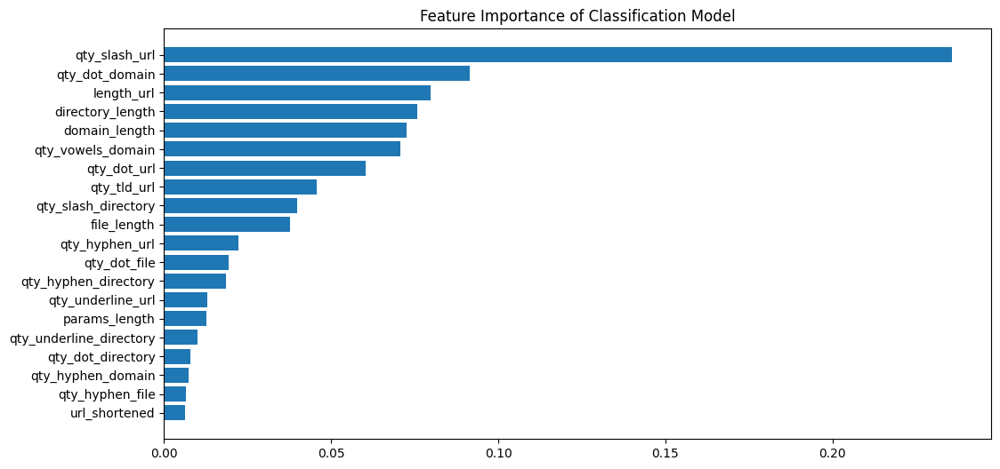

In [ ]:
feat_importance(model, feat_cols, path="../features/features_malicious_url.pkl")

Explainer expected value: [0.93982478 0.06017522]


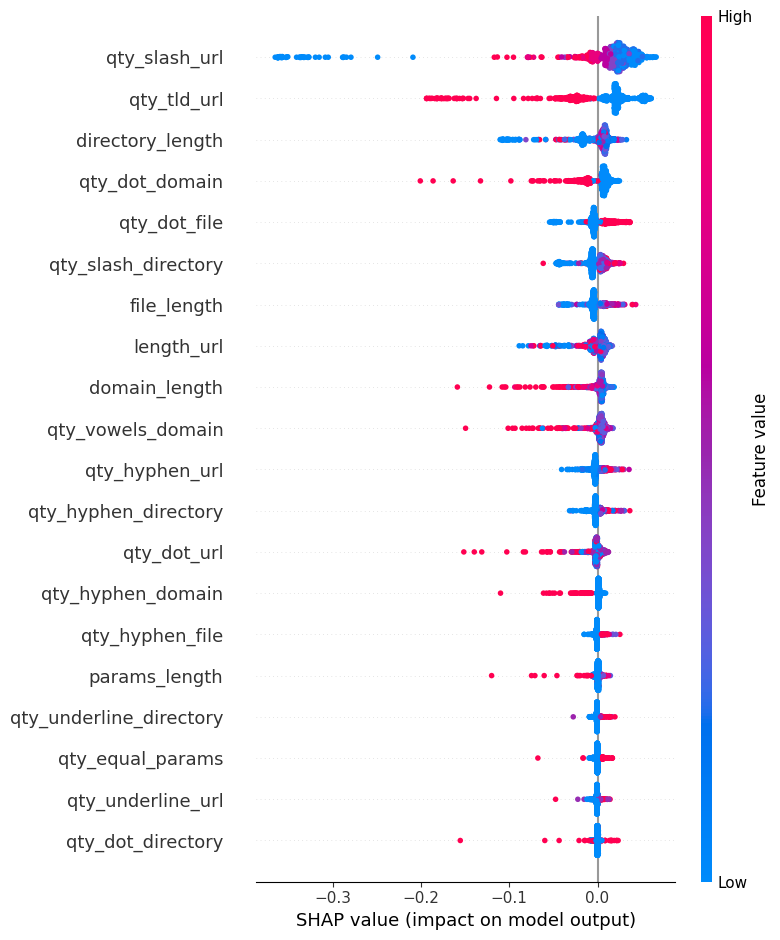

In [ ]:
shap_plot(df, "phishing", 1000)

In [ ]:
lime_plot(X_train, X_test, y_test, 5, model)

Instance 1:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


Instance 2:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


Instance 3:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


Instance 4:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


Instance 5:
True Class: Not Phishing
Predicted Class: Not Phishing
Explanation for Predicted Class:


## Evaluation

In [ ]:
displays = all_displays()
displays

[('CalibrationDisplay', sklearn.calibration.CalibrationDisplay),
 ('ConfusionMatrixDisplay',
  sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay),
 ('DecisionBoundaryDisplay',
  sklearn.inspection._plot.decision_boundary.DecisionBoundaryDisplay),
 ('DetCurveDisplay', sklearn.metrics._plot.det_curve.DetCurveDisplay),
 ('LearningCurveDisplay', sklearn.model_selection._plot.LearningCurveDisplay),
 ('PartialDependenceDisplay',
  sklearn.inspection._plot.partial_dependence.PartialDependenceDisplay),
 ('PrecisionRecallDisplay',
  sklearn.metrics._plot.precision_recall_curve.PrecisionRecallDisplay),
 ('PredictionErrorDisplay',
  sklearn.metrics._plot.regression.PredictionErrorDisplay),
 ('RocCurveDisplay', sklearn.metrics._plot.roc_curve.RocCurveDisplay),
 ('ValidationCurveDisplay',
  sklearn.model_selection._plot.ValidationCurveDisplay)]

## Confusion Matrix

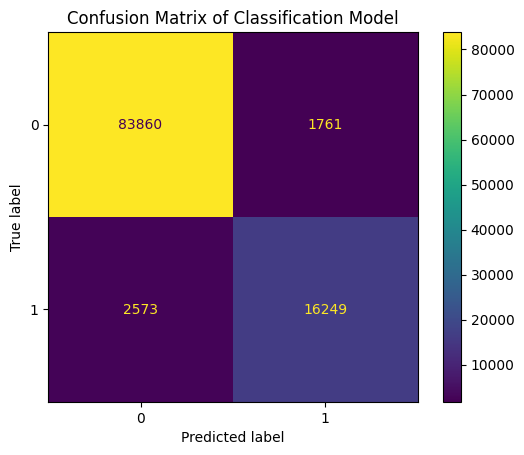

In [ ]:
confusion_plot(y_test, y_pred)

## Precision-Recall

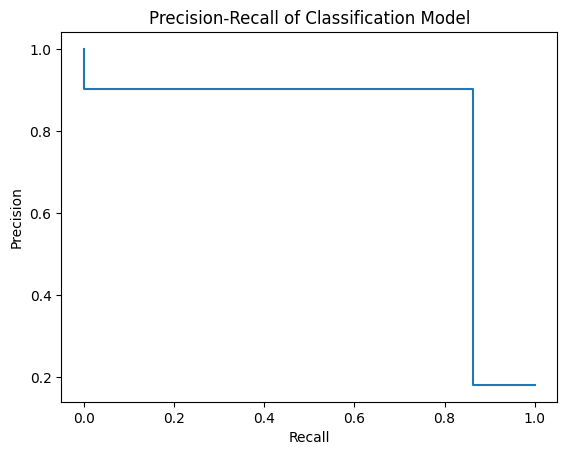

In [ ]:
precision_recall(y_test, y_pred)

## ROC Curve

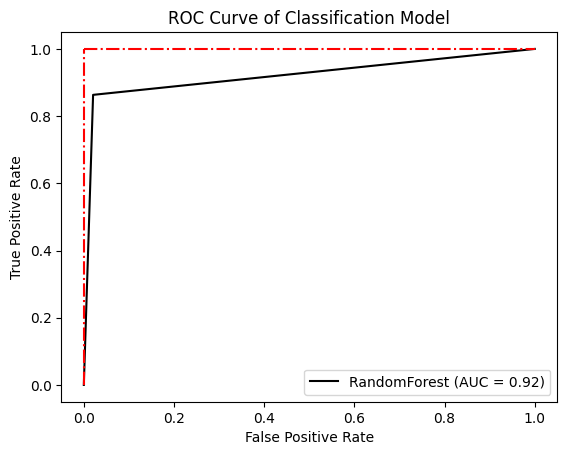

In [ ]:
roc_curve(y_test, y_pred)

## Calibration Display

A perfectly calibrated model would have a calibration curve closely aligned with the 45-degree diagonal line on the plot. This line represents ideal calibration, where the **predicted probabilities match the observed frequencies**. Deviations from this diagonal line indicate either overconfidence or underconfidence in the model's predictions.

- Overconfidence: If the curve lies above the diagonal line, the model is overconfident. This means there are more instances with predicted probabilities close to 1 than there should be, and the model's confidence in its predictions is higher than the actual success rate.
- Underconfidence: If the curve lies below the diagonal line, the model is underconfident. In this case, instances with high predicted probabilities are less frequent than they should be and the model's confidence is lower than the actual success rate.

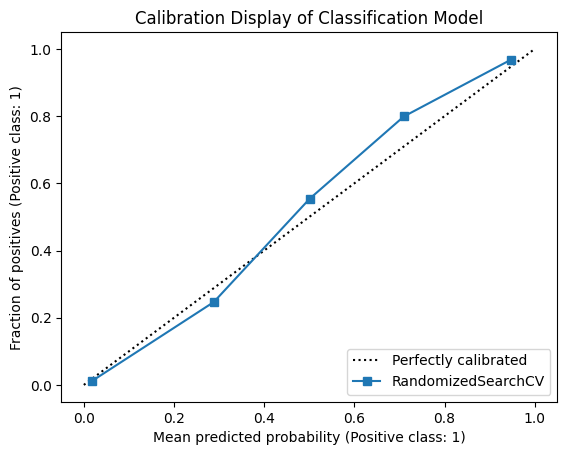

In [ ]:
calibration_disp(model, X_test, y_test)

## Learning Curve

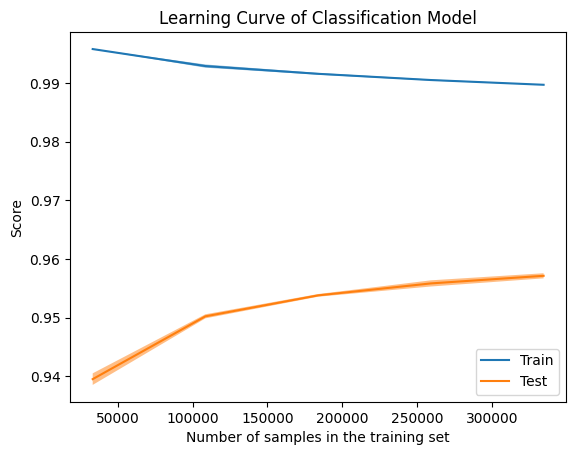

In [ ]:
learning_curv(clf, X_train, y_train)

## Ice Curve (top 3 features)

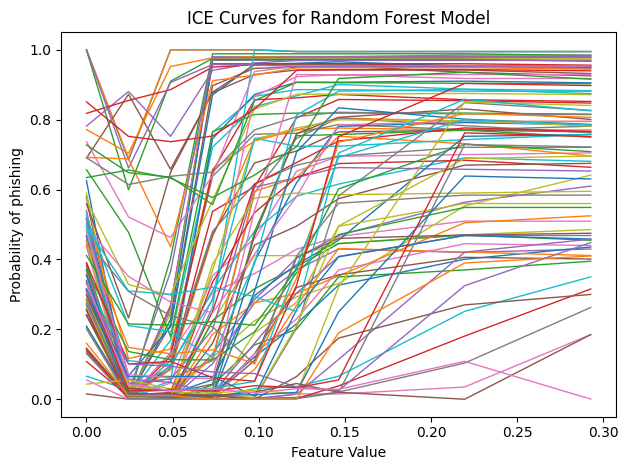

In [ ]:
ice_curve("qty_slash_url", X_train, model)

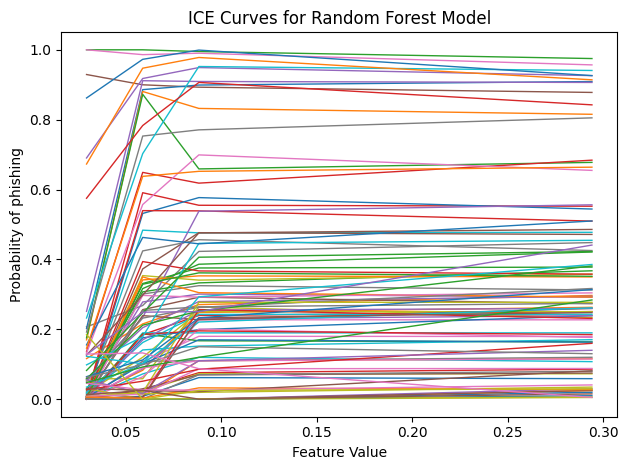

In [ ]:
ice_curve("qty_dot_domain", X_train, model)

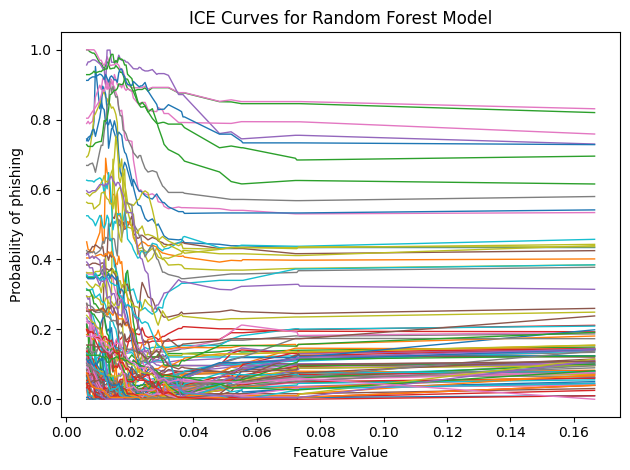

In [ ]:
ice_curve("length_url", X_train, model)